In [1]:
from CDDF_analysis.make_dr16q_plots import *

# plotting styles
import matplotlib as mpl
from matplotlib import pyplot as plt

%matplotlib inline

mpl.rcParams['figure.dpi']= 150

# Comparison with Solene's Catalog

Welcome to this example notebook! If you are interested in the DR16 DLA catalogue we have, but not interested in modifying the model(, which is in MATLAB) or running the model by yourself. This is the right place!

For people who prefer to look into the mathematics in the model, please refer to the README in the repo.

And you can always find all of the plotting functions for the paper in CDDF_analysis/make_dr16q_plots.py

- All of the data products of the GP DLA catalogue could be found in : [**download link**](https://drive.google.com/drive/folders/1uaaUVLpCdhSVC7rGFN_C5TuvQZLk2cyn?usp=sharing) (the same as the one in the README)
- It is required to have DR9's DLA labels as prior:

```bash
    # in shell
    cd data/scripts
    ./download_catalogs.sh
```

- DR16Q catalogue from SDSS is required. If you do not want to download it by yourselves, run the shell script:

```bash
    # in shell
    cd data/scripts
    ./download_catalogs_dr16q.sh
```

- `preloaded_file` : a file for all of the raw spectra (filtered by the condition given in the paper).
- `catalogue_file` : a processed MATLAB catalogue for sightlines in DR16Q
- `processed_file` : the GP DLA catalogue in MATLAB format
- `learned_file` : the learned GP null model
- `dla_concordance`: a text file for the DR9 DLA concordance catalogue
- `log_concordance`: a text file for the sightlines of DR9 concordance catalogue
- `snrs_file` : a file contains the SNRs of each spectrum
- `sub_dla` : whether you have a subDLA model in the processed_file
- `sample_file` : the Quasi-Monte Carlo samples used for computing the likelihood of the DLA model
- `occams_razor` : a regularization factor to prevent the DLA model overfit the data. Fixed to 1/30
- `dist_file` : the raw DR16Q catalogue from SDSS

In [2]:
qsos_dr16q = QSOLoaderDR16Q(
    preloaded_file="data/dr16q/processed/preloaded_qsos.mat",                        
    catalogue_file="data/dr16q/processed/catalog.mat",
    learned_file="data/dr16q/processed/learned_qso_model_lyseries_variance_wmu_boss_dr16q_minus_dr12q_gp_851-1421.mat", processed_file="data/dr16q/processed/processed_qsos_multi_meanflux_dr16q_full_int_small.mat",
    dla_concordance="data/dla_catalogs/dr9q_concordance/processed/dla_catalog",
    los_concordance="data/dla_catalogs/dr9q_concordance/processed/los_catalog",
    snrs_file="data/dr16q/processed/snrs_qsos_multi_meanflux_dr16q.mat",
    sub_dla=True,
    sample_file="data/dr16q/processed/dla_samples_a03_30000.mat",
    tau_sample_file="data/dr16q/processed/tau_0_samples_30000.mat",
    occams_razor=1/30,
    dist_file="data/dr16q/distfiles/DR16Q_v4.fits",
)

[Warning] 5652 DLAs lost and 54452 QSOs lost after np.in1d (searching matched thing_ids in the test data).
[Info] 160227 -> 159897 after filtering out uncertain z measures.
[Info] 159897 -> 159893 after setting IS_QSO_FINAL == 1.
[Info] 159893 -> 159889 after setting class_person == 3 or 0.
[Info] 159889 -> 159807 after filtering out SOURCE_Z: PIPE and Z > 5


## Plot the CDDF

The CDDFs we plotted here do not consider the uncertainty. And we only count DLAs above a certain confidence threshold. So the actual CDDF might be different depending on how people quantify the uncertainty and the way to propogate the DLA confidence to CDDF. But here we only consider point values without uncertainty and treat all DLAs above the threshold are real.

Need to put in tar:
- data/dr16q/distfiles/
- data/dr16q/distfiles/DLA_CAT_SDSS_DR16.fits
- CDDF_analysis/Lyb-Lya/

In [3]:
"""
Parameters:
----
dla_cnn (str) : path to Solene's catalog or SDSS DR16Q catalog
subdir (str) : path to the directory you want to store your plots
p_thresh (float) : only counts the DLA detections with pDLA > p_thresh
snr_thresh (float) : only counts the sightlines with SNR > snr_thresh
solene_dlas (bool) : when True, we are the dla_cnn we specified is Solene's catalog
voigt_fitter (bool) : when True, we are using NHI_FIT from Solene's catalog
our_sightlines (bool) : when True, we only count the sightlines overlapped with our GP catalog
lyb (bool) : when True, calculate the pathlength from lyb ~ lya
min_1040 (bool) : when True, calculate the pathlength from 1040 ~ lya
search_range_from_ours (bool) : when True, use the pathlength we used for GP catalog
"""

do_Parks_CDDF(
    qsos_dr16q,
    dla_cnn="data/dr16q/distfiles/DLA_CAT_SDSS_DR16.fits",
    subdir="solene_cddf_dr16q/",
    p_thresh=0.5,
    snr_thresh=-2,
    solene_dlas=True,
    voigt_fitter=False, # don't use the NHI_FIT, but use the CNN fitter as a comparison
    our_sightlines=True, # only plot the sightlines overlapped with us
    lyb=False,
    min_1040=False,
    search_range_from_ours=True, # we enforce the searching range to be the same as ours to make sure it is a fair comparison
    plot_gp=True,
    subdir_gp="CDDF_analysis/Lyb-Lya/")

[Info] Loading Solene's catalog
[Info] Load only our sightlines from Solene's.
Searching max_z_dla: lya ... 
Using our own searching range
[Info] Loading Solene's catalog
Searching max_z_dla: lya ... 
Using our own searching range
[Info] Loading Solene's catalog
Searching max_z_dla: lya ... 
Using our own searching range
[Info] Loading Solene's catalog
Searching max_z_dla: lya ... 
Using our own searching range
[Info] Loading Solene's catalog
Searching max_z_dla: lya ... 
Using our own searching range


<Figure size 900x600 with 0 Axes>

In [4]:
class PDF(object):
    def __init__(self, filename, size=(300,300)):
        self.filename = filename
        self.size = size

    def _repr_html_(self):
        return '<iframe src={0} width={1[0]} height={1[1]}></iframe>'.format(self.filename, self.size)


cddf = PDF(filename='solene_cddf_dr16q/cddf_solene.pdf')
cddf

In [5]:
do_Parks_dNdX(
    qsos_dr16q,
    dla_cnn="data/dr16q/distfiles/DLA_CAT_SDSS_DR16.fits",
    subdir="solene_cddf_dr16q/",
    p_thresh=0.5,
    snr_thresh=-2,
    solene_dlas=True,
    voigt_fitter=False, # don't use the NHI_FIT, but use the CNN fitter as a comparison
    our_sightlines=True, # only plot the sightlines overlapped with us
    lyb=False,
    min_1040=False,
    search_range_from_ours=True, # we enforce the searching range to be the same as ours to make sure it is a fair comparison
    plot_gp=True,
    subdir_gp="CDDF_analysis/Lyb-Lya/")

[Info] Loading Solene's catalog
Searching max_z_dla: lya ... 
Using our own searching range


<Figure size 900x600 with 0 Axes>

In [6]:
dndx = PDF(filename='solene_cddf_dr16q/dndx_solene.pdf')
dndx

### CDDF of the NHI_FIT

`NHI_FIT` is provided in Solene's catalog, which is a re-fit of DLAs found by CNN. The detailed description provided by the paper is as follows:

- `NHI_FIT`: the logarithm of the absorber column density as found by the Voigt-profile fitter for absorbers in the rest-frame range 1,040 ̊A ≤ $\lambda_{RF}$ ≤ 1,216 ̊A and $\log{N(\mathrm{HI})} < 22$. This parameter is setto -1 for absorbers that do not meet the criteria


In [7]:
# re-load the QSOLoader just in case 
qsos_dr16q = QSOLoaderDR16Q(
    preloaded_file="data/dr16q/processed/preloaded_qsos.mat",                        
    catalogue_file="data/dr16q/processed/catalog.mat",
    learned_file="data/dr16q/processed/learned_qso_model_lyseries_variance_wmu_boss_dr16q_minus_dr12q_gp_851-1421.mat", processed_file="data/dr16q/processed/processed_qsos_multi_meanflux_dr16q_full_int_small.mat",
    dla_concordance="data/dla_catalogs/dr9q_concordance/processed/dla_catalog",
    los_concordance="data/dla_catalogs/dr9q_concordance/processed/los_catalog",
    snrs_file="data/dr16q/processed/snrs_qsos_multi_meanflux_dr16q.mat",
    sub_dla=True,
    sample_file="data/dr16q/processed/dla_samples_a03_30000.mat",
    tau_sample_file="data/dr16q/processed/tau_0_samples_30000.mat",
    occams_razor=1/30,
    dist_file="data/dr16q/distfiles/DR16Q_v4.fits",
)

[Warning] 5652 DLAs lost and 54452 QSOs lost after np.in1d (searching matched thing_ids in the test data).
[Info] 160227 -> 159897 after filtering out uncertain z measures.
[Info] 159897 -> 159893 after setting IS_QSO_FINAL == 1.
[Info] 159893 -> 159889 after setting class_person == 3 or 0.
[Info] 159889 -> 159807 after filtering out SOURCE_Z: PIPE and Z > 5


In [8]:
do_Parks_CDDF(
    qsos_dr16q,
    dla_cnn="data/dr16q/distfiles/DLA_CAT_SDSS_DR16.fits",
    subdir="solene_cddf_dr16q_fit/",
    p_thresh=0.5,
    snr_thresh=-2,
    solene_dlas=True,
    voigt_fitter=True, # use the NHI_FIT
    our_sightlines=True, # only plot the sightlines overlapped with us
    lyb=False,
    min_1040=False,
    search_range_from_ours=True, # we enforce the searching range to be the same as ours to make sure it is a fair comparison
    plot_gp=True,
    subdir_gp="CDDF_analysis/Lyb-Lya/")

[Info] Loading Solene's catalog
[Info] Load only our sightlines from Solene's.
Searching max_z_dla: lya ... 
Using our own searching range
[Info] Loading Solene's catalog
Searching max_z_dla: lya ... 
Using our own searching range
[Info] Loading Solene's catalog
Searching max_z_dla: lya ... 
Using our own searching range
[Info] Loading Solene's catalog
Searching max_z_dla: lya ... 
Using our own searching range
[Info] Loading Solene's catalog
Searching max_z_dla: lya ... 
Using our own searching range


<Figure size 900x600 with 0 Axes>

In [9]:
cddf_fit = PDF(filename="solene_cddf_dr16q_fit/cddf_solene.pdf")
cddf_fit

In [10]:
do_Parks_dNdX(
    qsos_dr16q,
    dla_cnn="data/dr16q/distfiles/DLA_CAT_SDSS_DR16.fits",
    subdir="solene_cddf_dr16q_fit/",
    p_thresh=0.5,
    snr_thresh=-2,
    solene_dlas=True,
    voigt_fitter=True, # use the NHI_FIT
    our_sightlines=True, # only plot the sightlines overlapped with us
    lyb=False,
    min_1040=False,
    search_range_from_ours=True, # we enforce the searching range to be the same as ours to make sure it is a fair comparison
    plot_gp=True,
    subdir_gp="CDDF_analysis/Lyb-Lya/")

[Info] Loading Solene's catalog
Searching max_z_dla: lya ... 
Using our own searching range


<Figure size 900x600 with 0 Axes>

In [11]:
dndx_fit = PDF(filename="solene_cddf_dr16q_fit/dndx_solene.pdf")
dndx_fit

## Plot the individual spectrum

In [12]:
# re-load the QSOLoader just in case 
qsos_dr16q = QSOLoaderDR16Q(
    preloaded_file="data/dr16q/processed/preloaded_qsos.mat",                        
    catalogue_file="data/dr16q/processed/catalog.mat",
    learned_file="data/dr16q/processed/learned_qso_model_lyseries_variance_wmu_boss_dr16q_minus_dr12q_gp_851-1421.mat", processed_file="data/dr16q/processed/processed_qsos_multi_meanflux_dr16q_full_int_small.mat",
    dla_concordance="data/dla_catalogs/dr9q_concordance/processed/dla_catalog",
    los_concordance="data/dla_catalogs/dr9q_concordance/processed/los_catalog",
    snrs_file="data/dr16q/processed/snrs_qsos_multi_meanflux_dr16q.mat",
    sub_dla=True,
    sample_file="data/dr16q/processed/dla_samples_a03_30000.mat",
    tau_sample_file="data/dr16q/processed/tau_0_samples_30000.mat",
    occams_razor=1/30,
    dist_file="data/dr16q/distfiles/DR16Q_v4.fits",
)

[Warning] 5652 DLAs lost and 54452 QSOs lost after np.in1d (searching matched thing_ids in the test data).
[Info] 160227 -> 159897 after filtering out uncertain z measures.
[Info] 159897 -> 159893 after setting IS_QSO_FINAL == 1.
[Info] 159893 -> 159889 after setting class_person == 3 or 0.
[Info] 159889 -> 159807 after filtering out SOURCE_Z: PIPE and Z > 5


[Info] map_tau_0 = 0.005281, map_beta = 3.085
[Info] Load only our sightlines from Solene's.


(-1.0, 5.0)

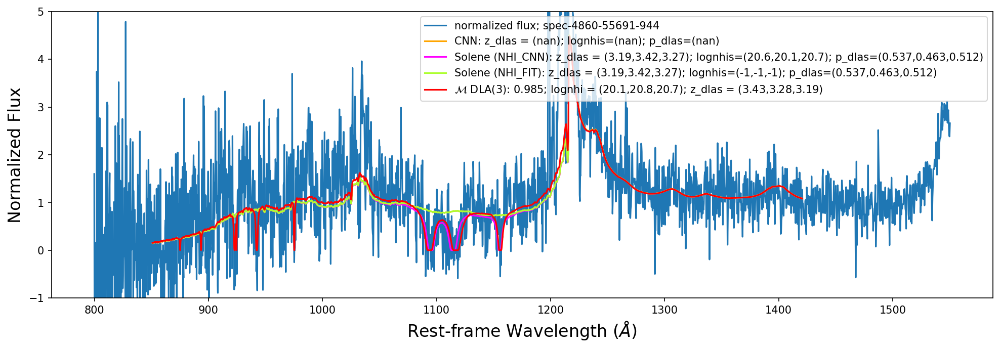

In [13]:
# SDSS identification number
thing_id = 177872172
# the number in our catalog
nspec = np.where(np.isin(qsos_dr16q.thing_ids, thing_id))[0][0]

# Parks=True: plotting the DLAs in DR16Q_v4.fits
# Solene=True: plotting the DLAs in Solene's catalog
qsos_dr16q.plot_this_mu(nspec, Parks=True, Solene=True, voigt_fitter=True, dla_solene="data/dr16q/distfiles/DLA_CAT_SDSS_DR16.fits")
plt.ylim(-1, 5)

[Info] map_tau_0 = 0.005316, map_beta = 3.264


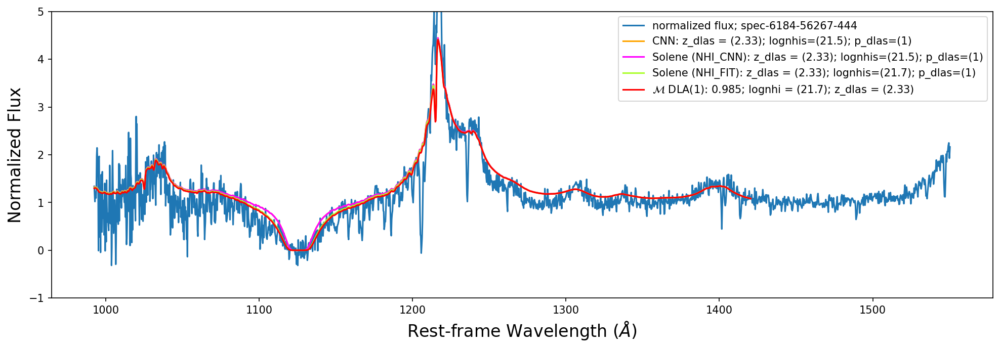

[Info] map_tau_0 = 0.005102, map_beta = 3.127


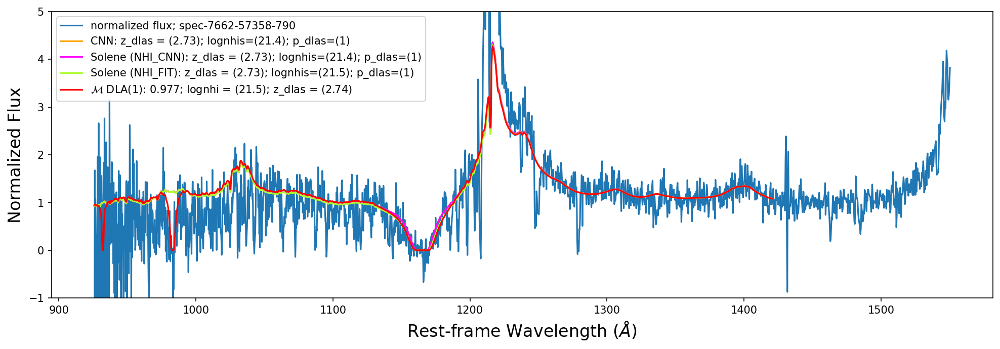

[Info] map_tau_0 = 0.00413, map_beta = 3.12


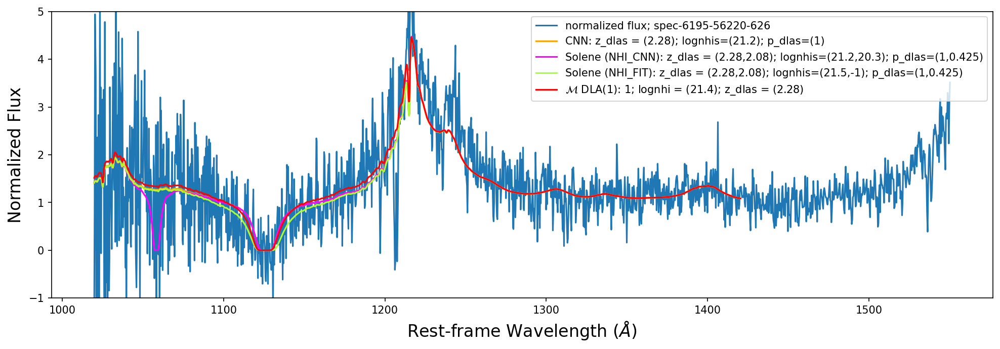

[Info] map_tau_0 = 0.004762, map_beta = 3.084


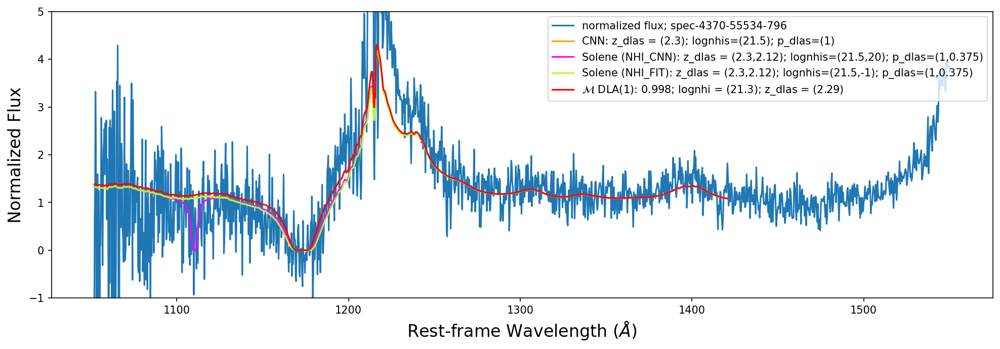

[Info] map_tau_0 = 0.004178, map_beta = 3.22


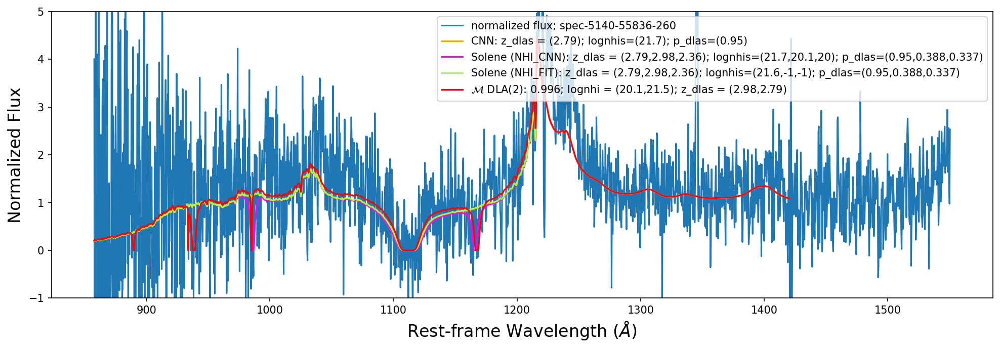

[Info] map_tau_0 = 0.005677, map_beta = 3.133


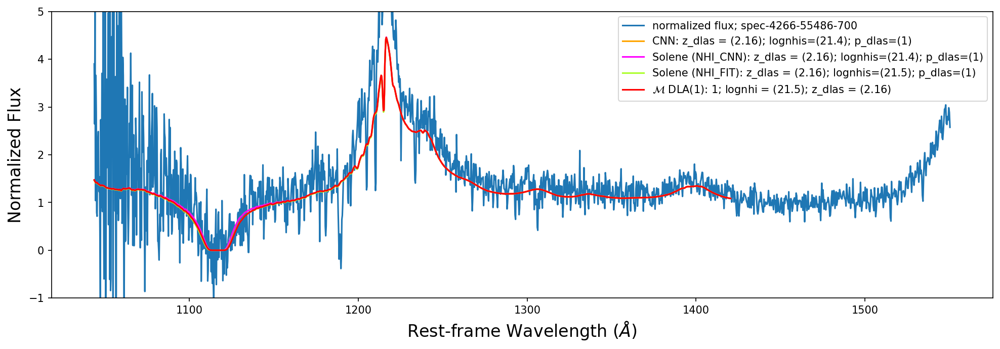

[Info] map_tau_0 = 0.005002, map_beta = 3.163


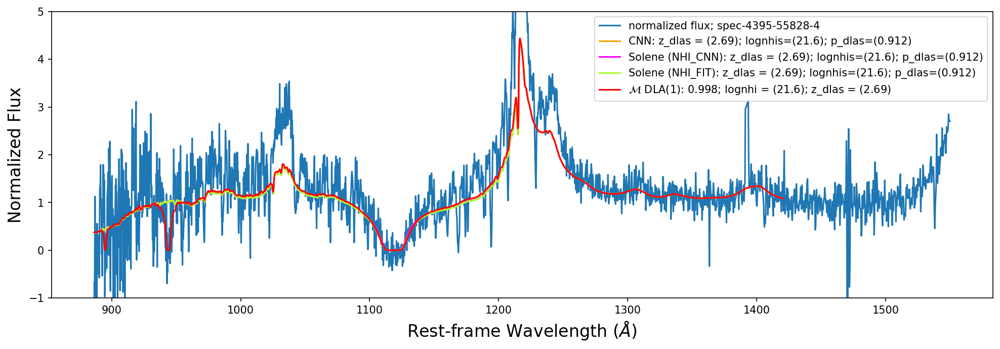

[Info] map_tau_0 = 0.006196, map_beta = 3.259


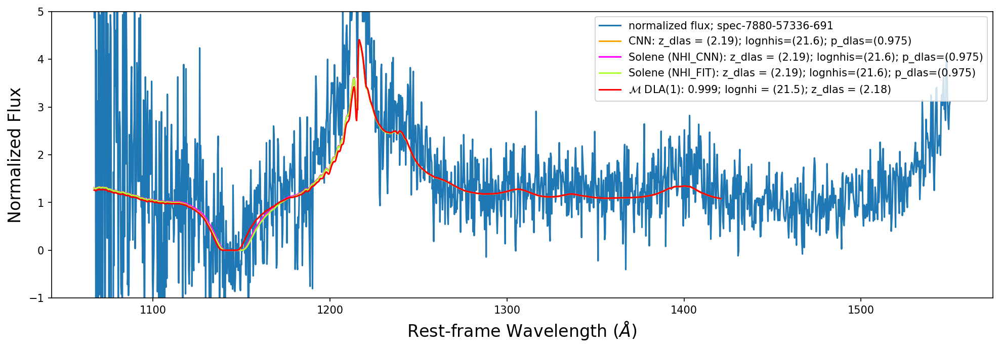

[Info] map_tau_0 = 0.005589, map_beta = 3.178


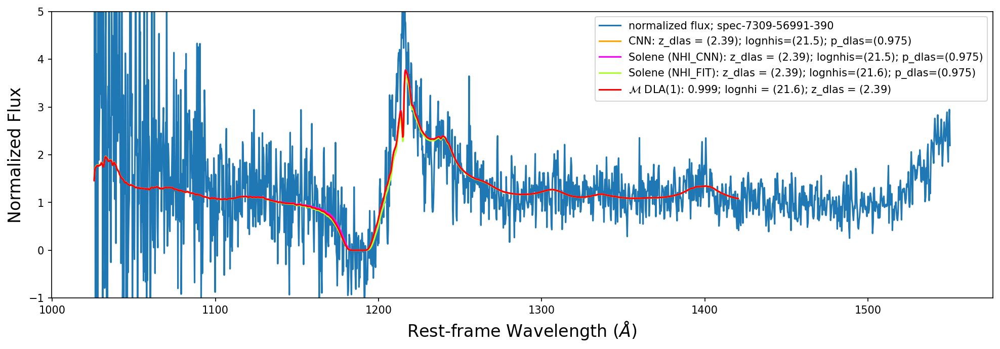

[Info] map_tau_0 = 0.004636, map_beta = 3.09


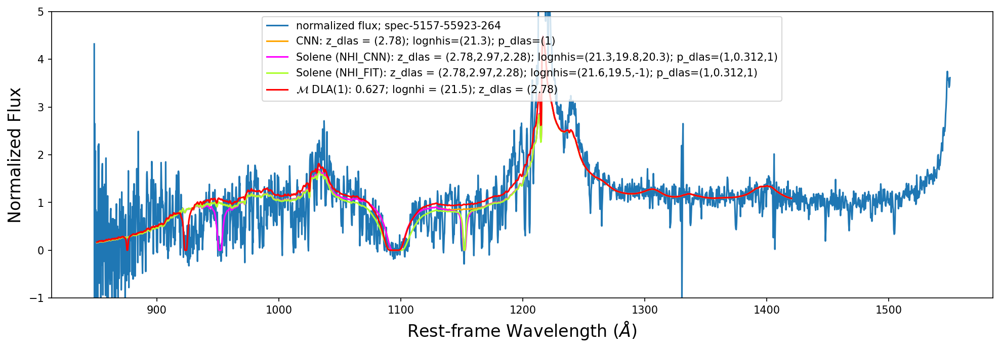

In [14]:
# Plot first 10 Larger DLAs
ind = (qsos_dr16q.dict_solene["log_nhis_fitter"] > 21.5) & (qsos_dr16q.dict_solene["dla_confidences"] > 0.9)

# SDSS identification number
thing_ids = np.unique(qsos_dr16q.dict_solene["thing_ids"][ind])
# the number in our catalog
nspecs = np.where(np.isin(qsos_dr16q.thing_ids, thing_ids))[0]

# Parks=True: plotting the DLAs in DR16Q_v4.fits
# Solene=True: plotting the DLAs in Solene's catalog

for nspec in nspecs[:10]:
    qsos_dr16q.plot_this_mu(nspec, Parks=True, Solene=True, voigt_fitter=True, dla_solene="data/dr16q/distfiles/DLA_CAT_SDSS_DR16.fits")
    plt.ylim(-1, 5)
    plt.show()

[Info] map_tau_0 = 0.005016, map_beta = 3.209


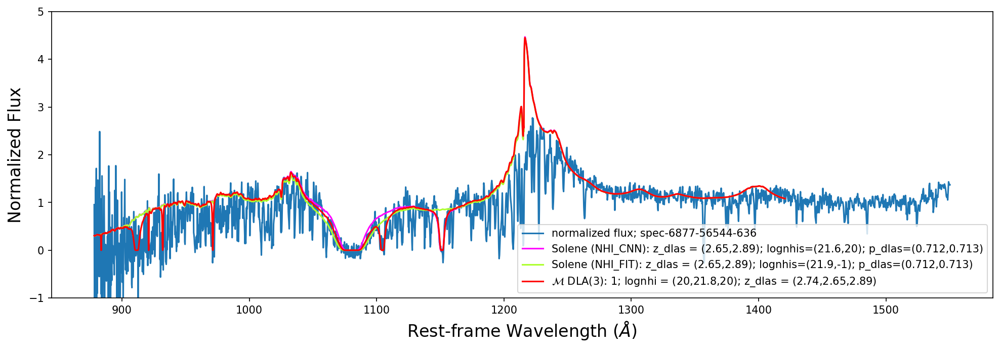

[Info] map_tau_0 = 0.004272, map_beta = 3.233


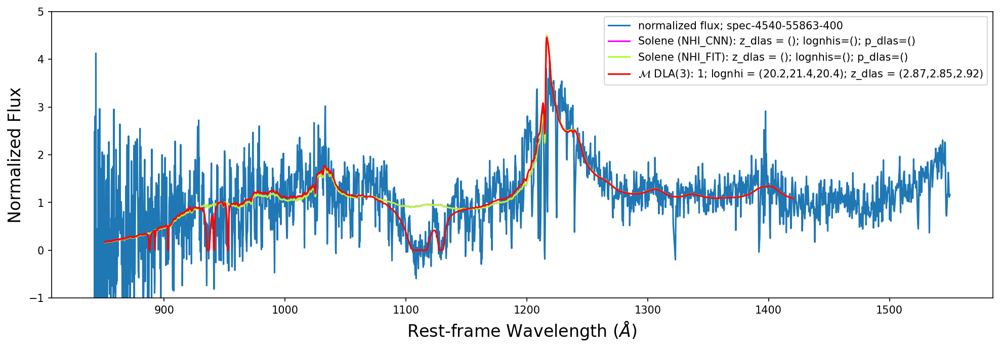

[Info] map_tau_0 = 0.003894, map_beta = 3.137


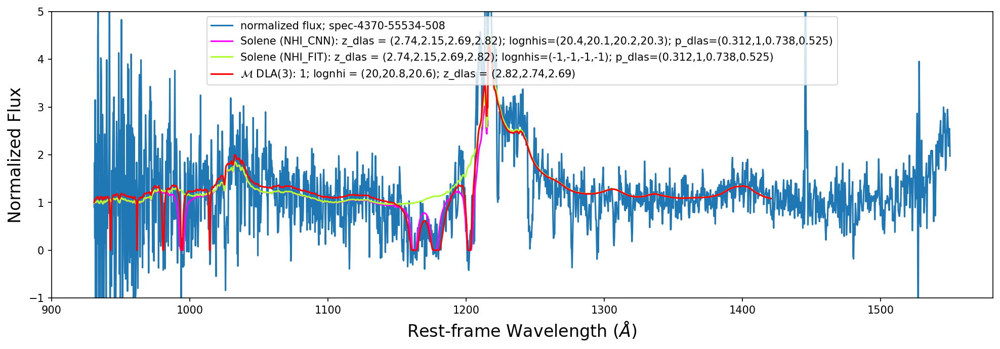

[Info] map_tau_0 = 0.005729, map_beta = 3.144


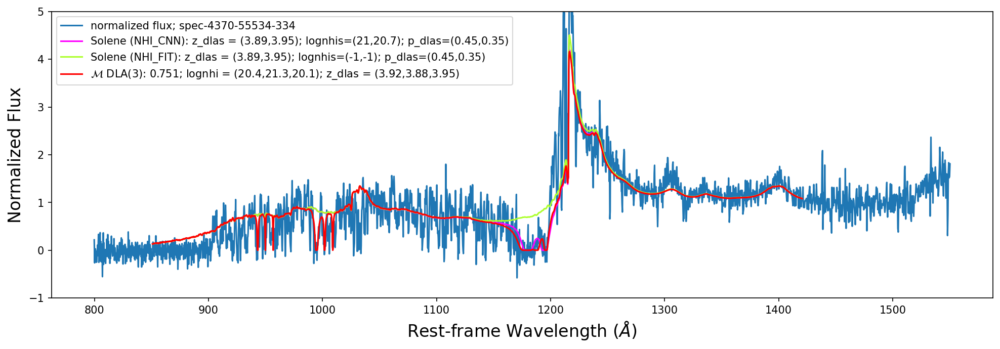

[Info] map_tau_0 = 0.003952, map_beta = 3.156


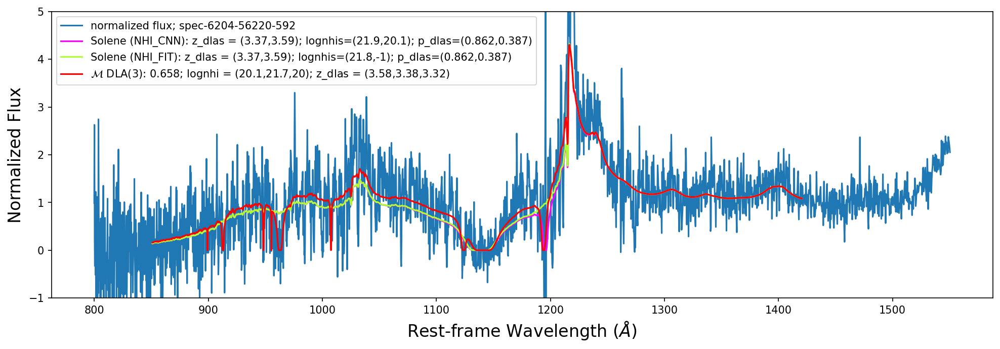

[Info] map_tau_0 = 0.004689, map_beta = 3.186


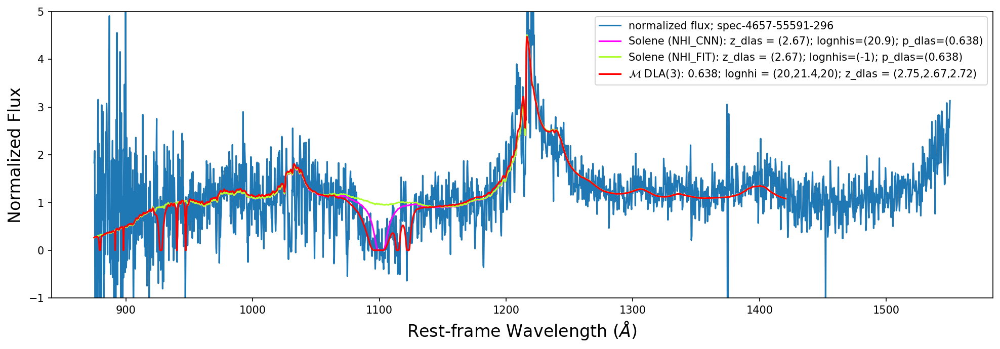

[Info] map_tau_0 = 0.004355, map_beta = 3.126


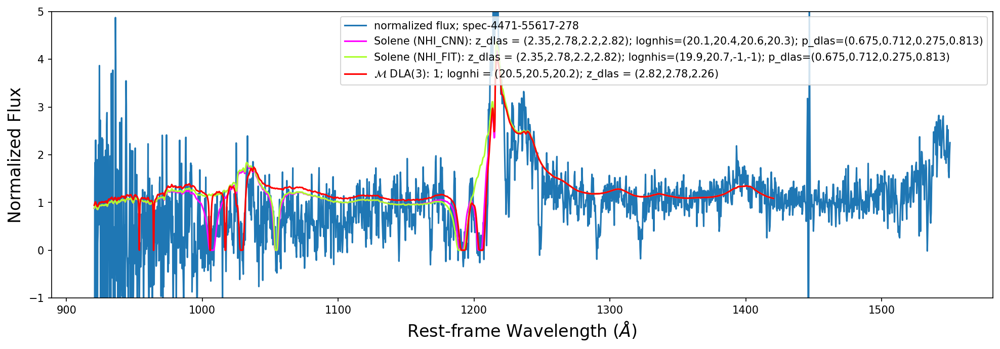

[Info] map_tau_0 = 0.004442, map_beta = 3.137


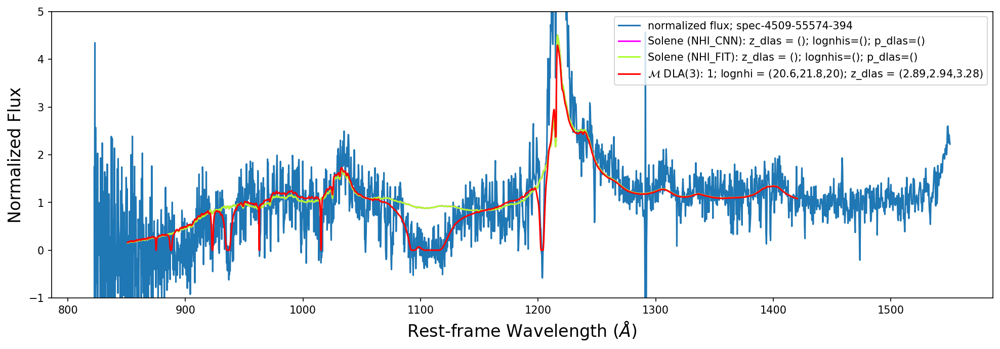

[Info] map_tau_0 = 0.004245, map_beta = 3.111


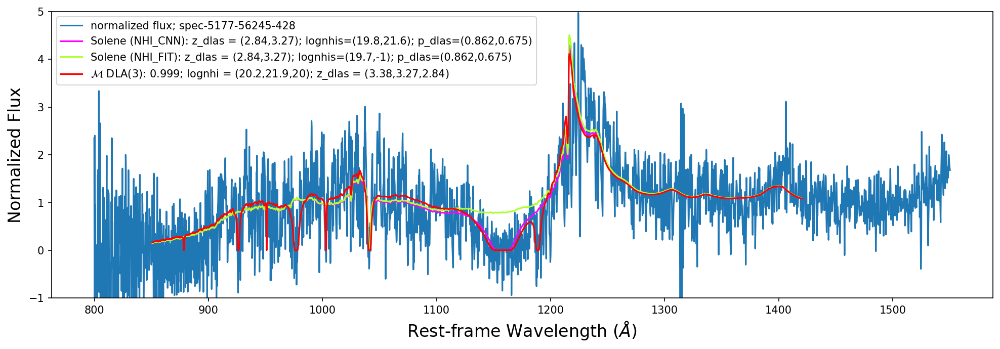

[Info] map_tau_0 = 0.004124, map_beta = 3.285


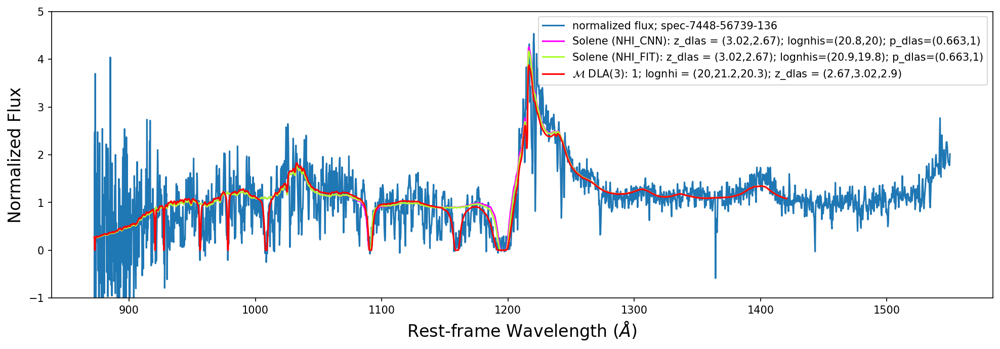

[Info] map_tau_0 = 0.003852, map_beta = 3.047


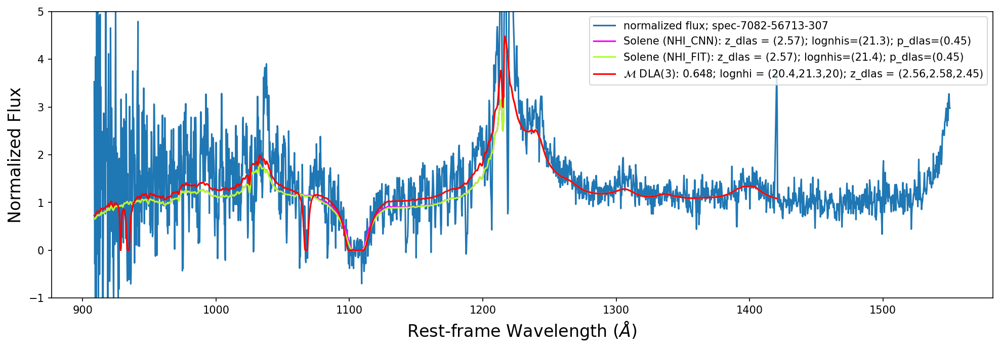

[Info] map_tau_0 = 0.005187, map_beta = 3.143


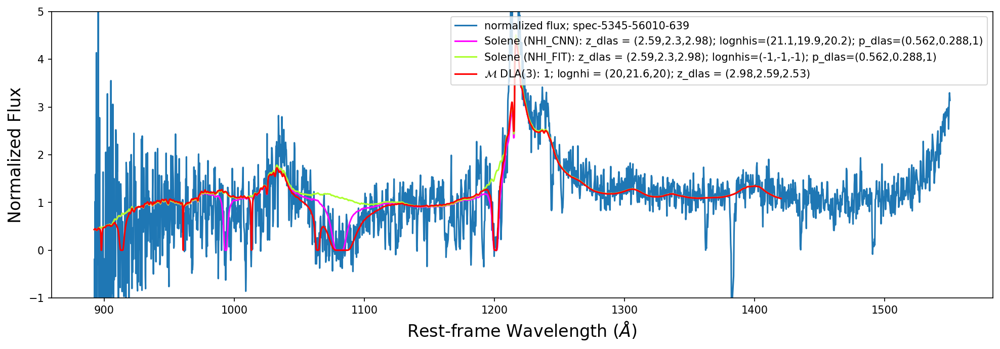

[Info] map_tau_0 = 0.005332, map_beta = 3.192


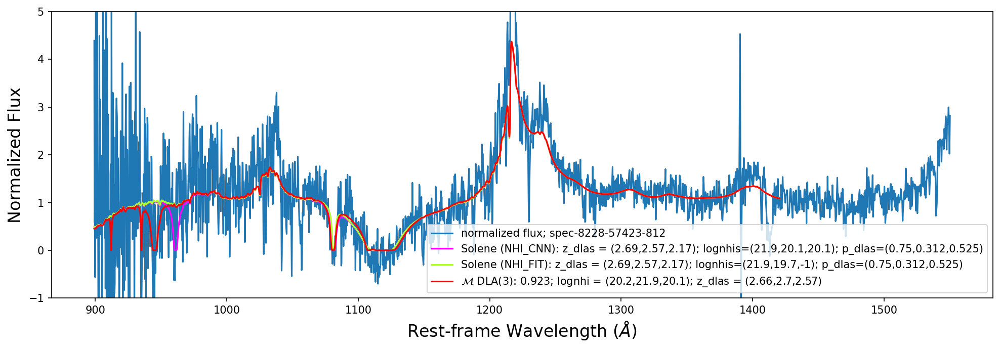

[Info] map_tau_0 = 0.005143, map_beta = 3.119


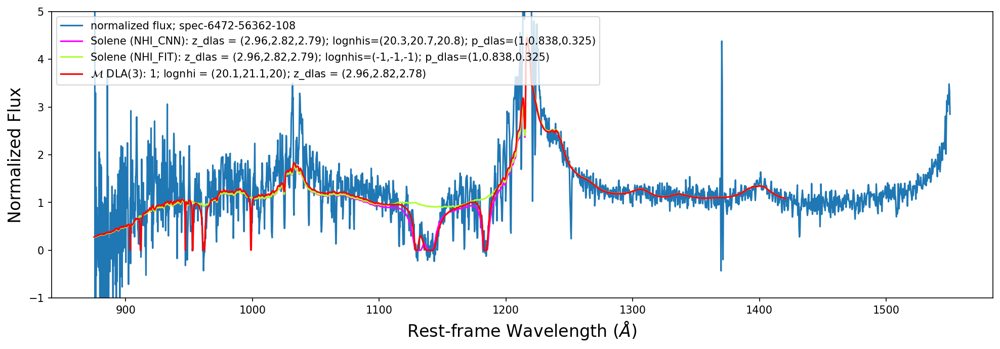

[Info] map_tau_0 = 0.005425, map_beta = 3.092


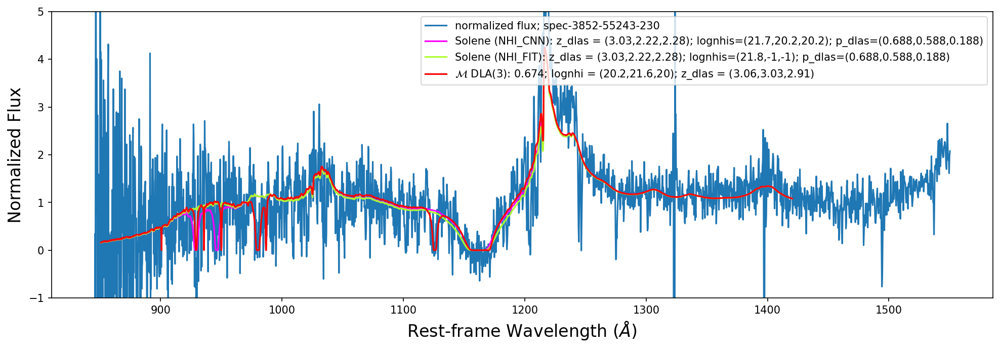

[Info] map_tau_0 = 0.005869, map_beta = 3.167


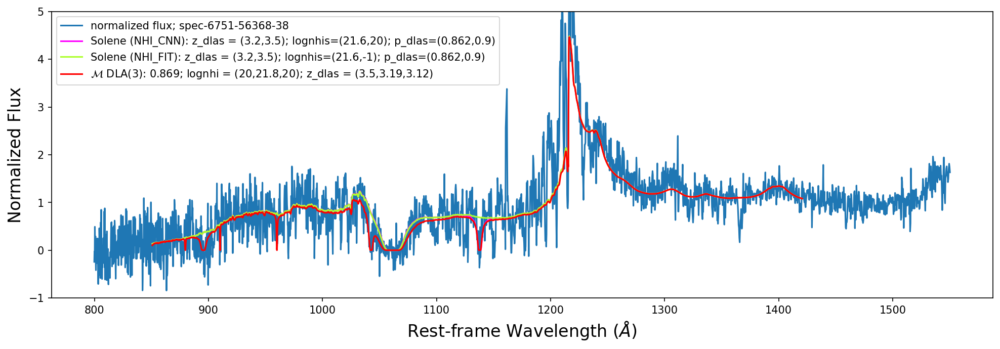

[Info] map_tau_0 = 0.005281, map_beta = 3.085


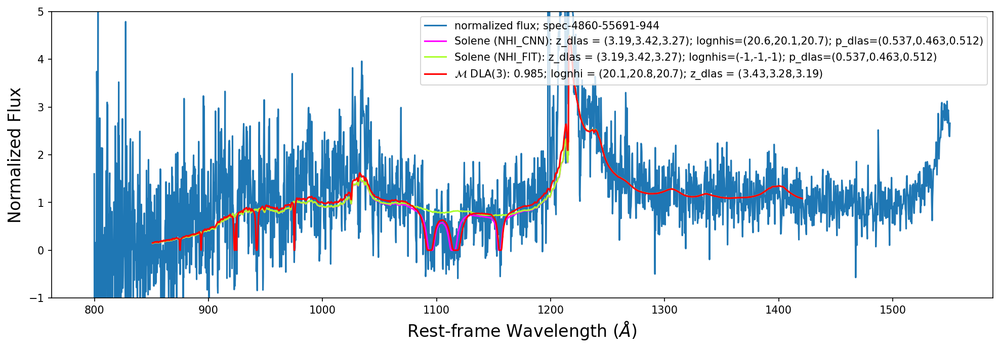

[Info] map_tau_0 = 0.003762, map_beta = 3.074


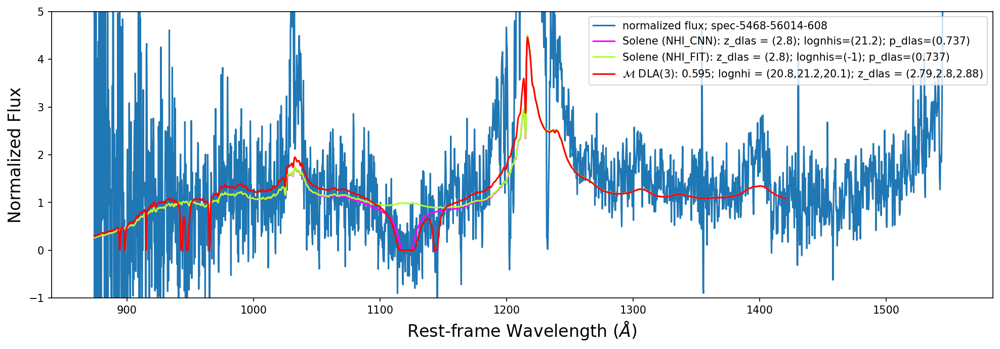

[Info] map_tau_0 = 0.004336, map_beta = 3.139


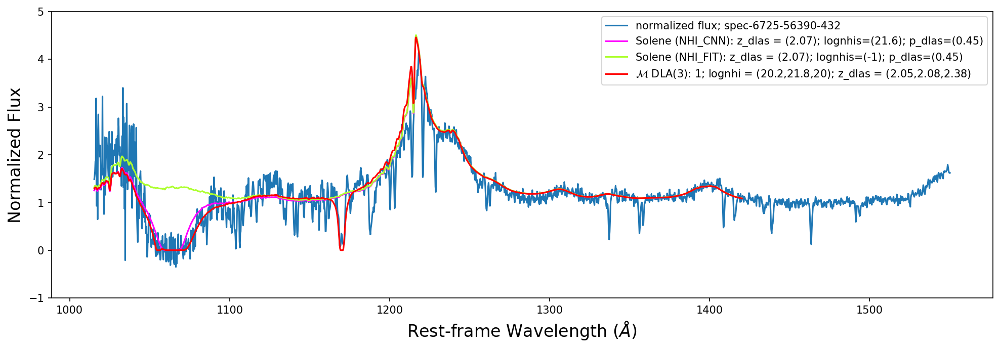

[Info] map_tau_0 = 0.006465, map_beta = 3.126


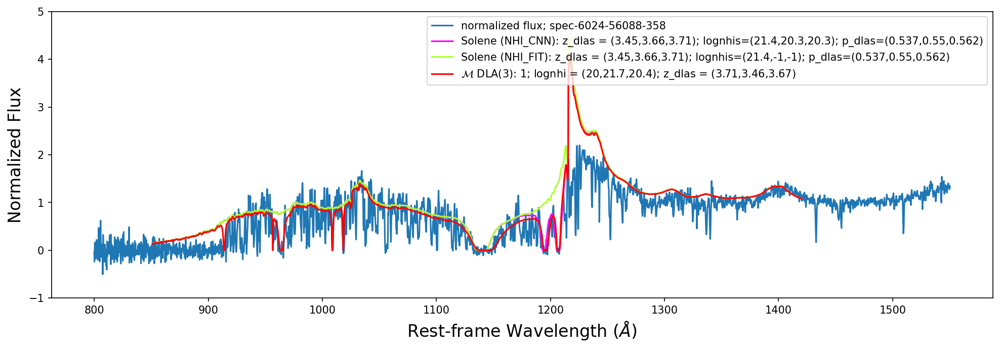

[Info] map_tau_0 = 0.006628, map_beta = 3.077


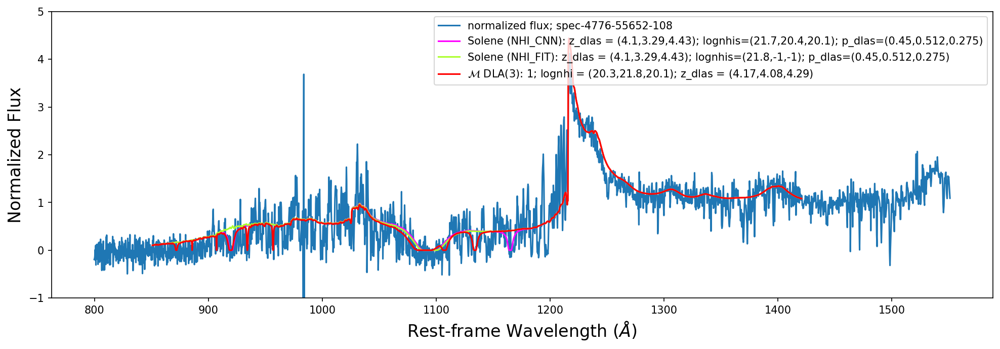

[Info] map_tau_0 = 0.005054, map_beta = 3.11


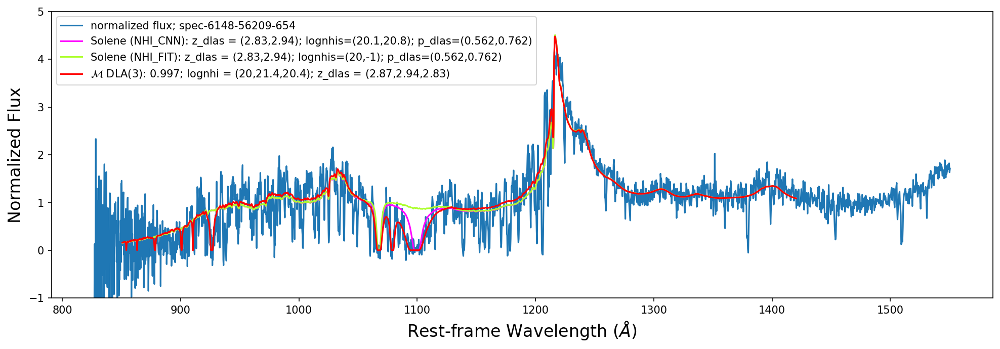

[Info] map_tau_0 = 0.005417, map_beta = 3.018


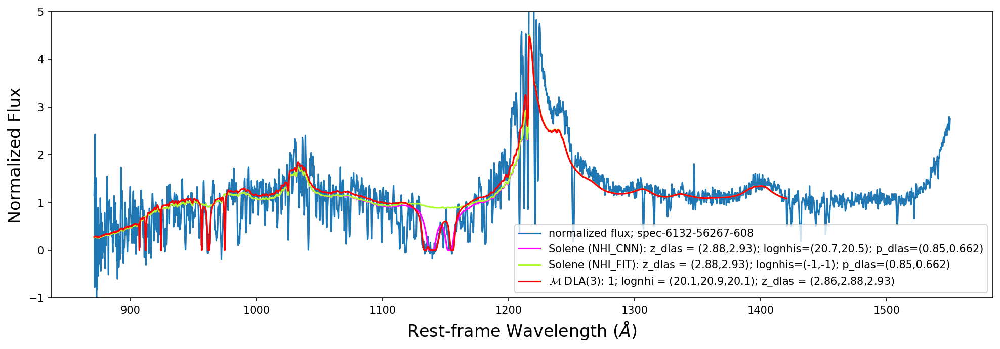

[Info] map_tau_0 = 0.003858, map_beta = 3.158


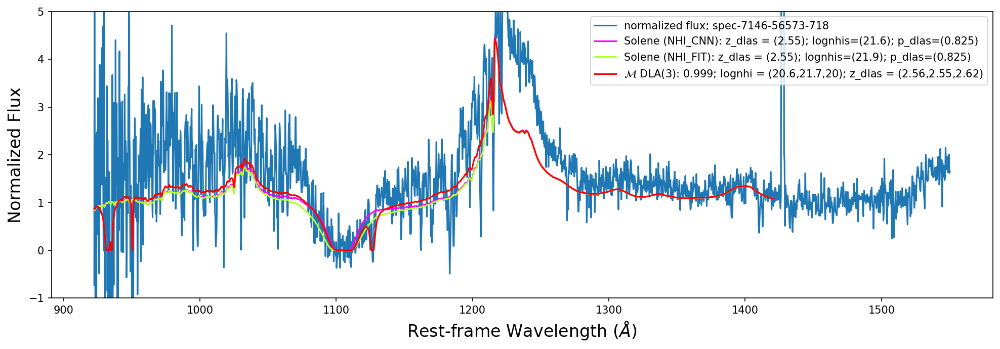

In [15]:
# Plot the cases of overlapping or DLAs/subDLAs very close to each other
selected_thing_ids = [
    147946665,
    177872172,
    194921144,
    209755715,
    225460412,
    229232104,
    236392107,
    248088771,
    268065713,
    269549832,
    296660604,
    307451922,
    332071702,
    349105103,
    371695814,
    37208460,
    416180602,
    473203069,
    487498804,
    488562798,
    501293410,
    540640951,
    54806980,
    60605850,
]

all_specs = np.where(np.isin(qsos_dr16q.thing_ids, selected_thing_ids))[0]

for nspec in all_specs:
    qsos_dr16q.plot_this_mu(nspec, Parks=False, Solene=True, voigt_fitter=True, dla_solene="data/dr16q/distfiles/DLA_CAT_SDSS_DR16.fits")
    plt.ylim(-1, 5)
    save_figure("plot_specs/CNN_overlaps_sep/this_mu_{}".format(qsos_dr16q.thing_ids[nspec]))
    plt.show()
